# Multi task for gender, age and ethnicity classification

Author : Utpalraj Kemprai

## Importing libraries

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, transforms
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import numpy as np
import pandas as pd
import os
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt

In [ ]:
# use default theme for all the plots
plt.style.use('default')

## Downloading the Fairface dataset

In [ ]:
# # download dataset and unzip from kaggle
# !kaggle datasets download mehmoodsheikh/fairface-dataset
# !unzip fairface-dataset.zip -d fairface

Streaming output truncated to the last 5000 lines.
  inflating: fairface/FairFace/val/5499.jpg  
  inflating: fairface/FairFace/val/55.jpg  
  inflating: fairface/FairFace/val/550.jpg  
  inflating: fairface/FairFace/val/5500.jpg  
  inflating: fairface/FairFace/val/5501.jpg  
  inflating: fairface/FairFace/val/5502.jpg  
  inflating: fairface/FairFace/val/5503.jpg  
  inflating: fairface/FairFace/val/5504.jpg  
  inflating: fairface/FairFace/val/5505.jpg  
  inflating: fairface/FairFace/val/5506.jpg  
  inflating: fairface/FairFace/val/5507.jpg  
  inflating: fairface/FairFace/val/5508.jpg  
  inflating: fairface/FairFace/val/5509.jpg  
  inflating: fairface/FairFace/val/551.jpg  
  inflating: fairface/FairFace/val/5510.jpg  
  inflating: fairface/FairFace/val/5511.jpg  
  inflating: fairface/FairFace/val/5512.jpg  
  inflating: fairface/FairFace/val/5513.jpg  
  inflating: fairface/FairFace/val/5514.jpg  
  inflating: fairface/FairFace/val/5515.jpg  
  inflating: fairface/FairFace/va

In [ ]:
# download dataset from google drive
import gdown
file_id = '1Z1RqRo0_JiavaZw2yzZG6WETdZQ8qX86'
gdown.download(f'https://drive.google.com/uc?id={file_id}', 'fairface_dataset.zip', quiet=False)

Downloading...
From (original): https://drive.google.com/uc?id=1Z1RqRo0_JiavaZw2yzZG6WETdZQ8qX86
From (redirected): https://drive.google.com/uc?id=1Z1RqRo0_JiavaZw2yzZG6WETdZQ8qX86&confirm=t&uuid=512b1723-a47e-4073-ad86-18dbe69decdb
To: /content/fairface_dataset.zip
100%|██████████| 578M/578M [00:09<00:00, 62.8MB/s]


'fairface_dataset.zip'

In [ ]:
# https://drive.google.com/file/d/1i1L3Yqwaio7YSOCj7ftgk8ZZchPG7dmH/view?usp=sharing # label_train
# https://drive.google.com/file/d/1wOdja-ezstMEp81tX1a-EYkFebev4h7D/view?usp=sharing # label_val
train_label_file_id = '1i1L3Yqwaio7YSOCj7ftgk8ZZchPG7dmH'
val_label_file_id = '1wOdja-ezstMEp81tX1a-EYkFebev4h7D'

In [ ]:
gdown.download(f'https://drive.google.com/uc?id={train_label_file_id}', 'fairface_label_train.csv', quiet=False)
gdown.download(f'https://drive.google.com/uc?id={val_label_file_id}', 'fairface_label_val.csv', quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1i1L3Yqwaio7YSOCj7ftgk8ZZchPG7dmH
To: /content/fairface_label_train.csv
100%|██████████| 3.79M/3.79M [00:00<00:00, 26.3MB/s]
Downloading...
From: https://drive.google.com/uc?id=1wOdja-ezstMEp81tX1a-EYkFebev4h7D
To: /content/fairface_label_val.csv
100%|██████████| 448k/448k [00:00<00:00, 6.49MB/s]


'fairface_label_val.csv'

In [ ]:
!unzip fairface_dataset.zip

Streaming output truncated to the last 5000 lines.
  inflating: val/5370.jpg            
  inflating: val/5596.jpg            
  inflating: val/5875.jpg            
  inflating: val/5878.jpg            
  inflating: val/5879.jpg            
  inflating: val/5883.jpg            
  inflating: val/6126.jpg            
  inflating: val/6132.jpg            
  inflating: val/6144.jpg            
  inflating: val/6150.jpg            
  inflating: val/6340.jpg            
  inflating: val/7190.jpg            
  inflating: val/7734.jpg            
  inflating: val/7747.jpg            
  inflating: val/7872.jpg            
  inflating: val/7940.jpg            
  inflating: val/8065.jpg            
  inflating: val/8069.jpg            
  inflating: val/8125.jpg            
  inflating: val/8202.jpg            
  inflating: val/8204.jpg            
  inflating: val/8205.jpg            
  inflating: val/8268.jpg            
  inflating: val/8270.jpg            
  inflating: val/8281.jpg            

## View the dataset

### Training data

In [ ]:
label_train_data = pd.read_csv('fairface_label_train.csv')
label_train_data.head()

,file,age,gender,race,service_test
0,train/1.jpg,50-59,Male,East Asian,True
1,train/2.jpg,30-39,Female,Indian,False
2,train/3.jpg,3-9,Female,Black,False
3,train/4.jpg,20-29,Female,Indian,True
4,train/5.jpg,20-29,Female,Indian,True


In [ ]:
label_train_data['age'].unique()

array(['50-59', '30-39', '3-9', '20-29', '40-49', '10-19', '60-69', '0-2',
       'more than 70'], dtype=object)

In [ ]:
# replace 'more than 70' in dataframe with '70+'
label_train_data['age'] = label_train_data['age'].replace('more than 70', '70+')

<Axes: title={'center': 'Age Distribution in the training data'}, xlabel='age', ylabel='count'>

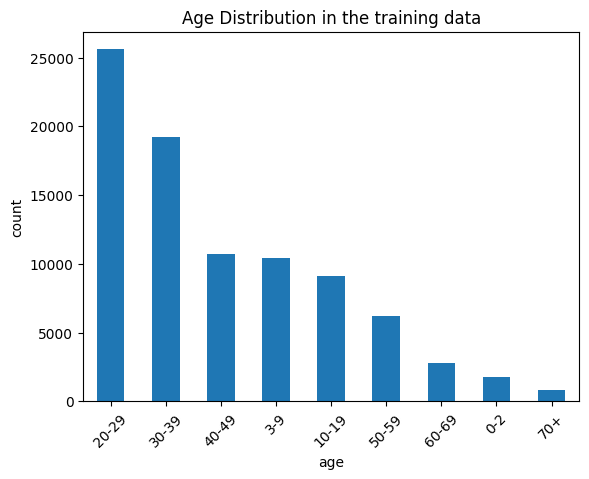

In [ ]:
# plot the bar graph for age
label_train_data['age'].value_counts().plot(kind='bar', rot = 45, ylabel = 'count', title = 'Age Distribution in the training data')

In [ ]:
label_train_data['gender'].unique()

array(['Male', 'Female'], dtype=object)

<Axes: title={'center': 'Gender Distribution in the training data'}, xlabel='gender', ylabel='count'>

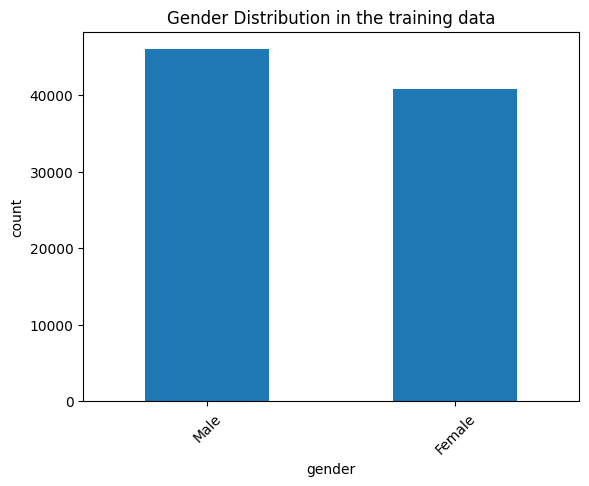

In [ ]:
# plot the bar graph for gender
label_train_data['gender'].value_counts().plot(kind='bar', title = 'Gender Distribution in the training data', rot = 45, ylabel = 'count')

In [ ]:
label_train_data['race'].unique()

array(['East Asian', 'Indian', 'Black', 'White', 'Middle Eastern',
       'Latino_Hispanic', 'Southeast Asian'], dtype=object)

<Axes: title={'center': 'Race Distribution in the training data'}, xlabel='race', ylabel='count'>

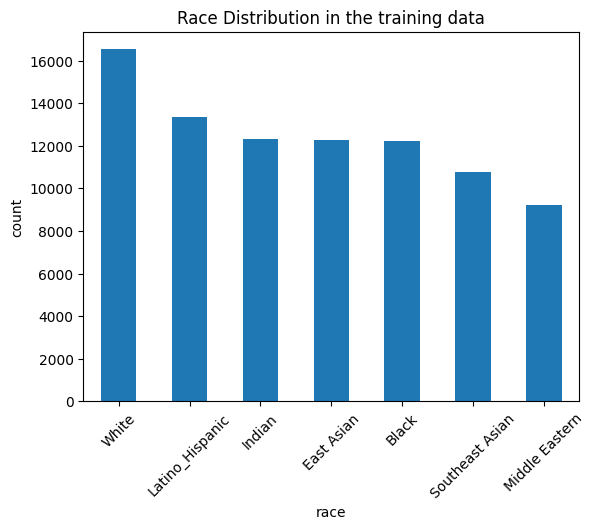

In [ ]:
# plot the bar graph for race
label_train_data['race'].value_counts().plot(kind='bar',title = 'Race Distribution in the training data', ylabel = 'count', rot = 45)

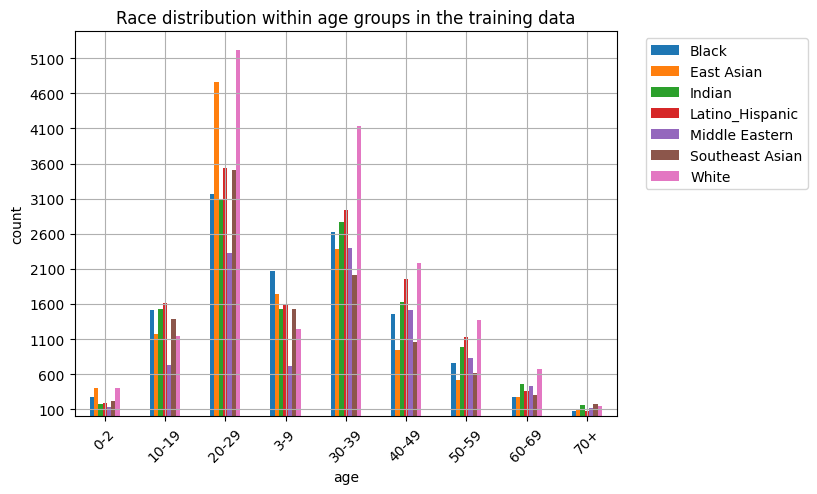

In [ ]:
# plot the age graph for race
label_train_data.groupby('age')['race'].value_counts().unstack().plot(kind='bar',title = "Race distribution within age groups in the training data", stacked=False,grid = True, rot = 45, figsize=(7,5),ylabel = 'count',yticks = list(range(100,5500,500)))
plt.legend(bbox_to_anchor=(1.04, 1), loc="upper left")

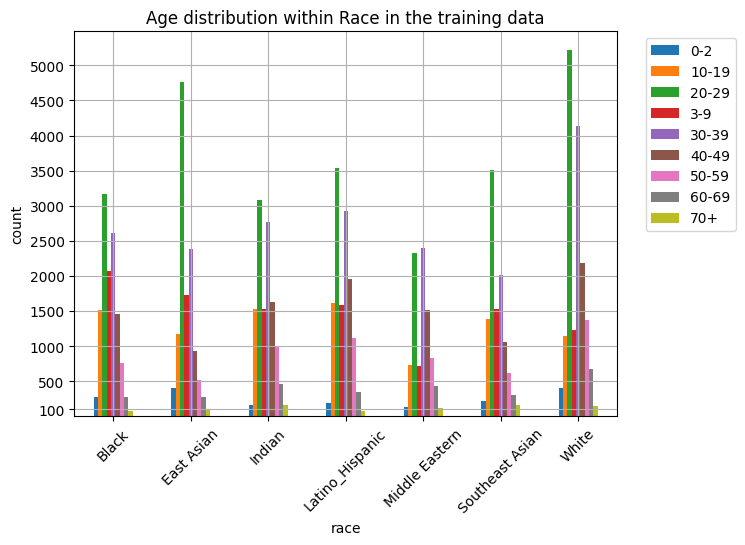

In [ ]:
# make a plot for age and race
label_train_data.groupby('race')['age'].value_counts().unstack().plot(kind='bar', title ="Age distribution within Race in the training data", stacked=False,grid = True, rot = 45, figsize = (7,5), yticks = [100] + list(range(500,5500,500)),ylabel = 'count')
plt.legend(bbox_to_anchor=(1.04, 1), loc="upper left")

<Axes: title={'center': 'Gender Distribution within Age group in the training data'}, xlabel='age', ylabel='Count'>

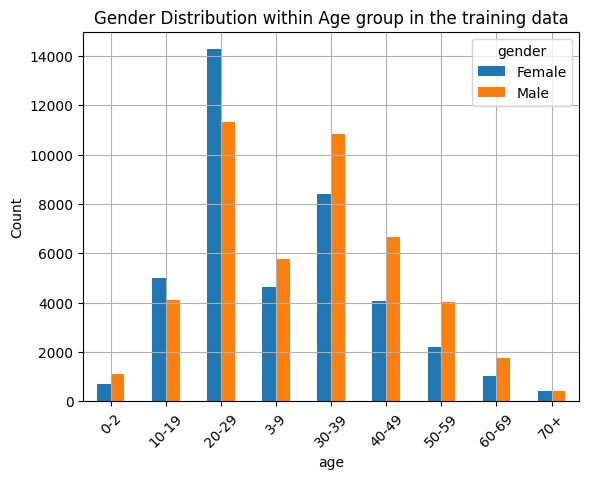

In [ ]:
label_train_data.groupby('age')['gender'].value_counts().unstack().plot(kind='bar', stacked=False,grid = True, ylabel = 'Count', title = "Gender Distribution within Age group in the training data", rot = 45)

<Axes: title={'center': 'Gender Distribution within Race in the training data'}, xlabel='race'>

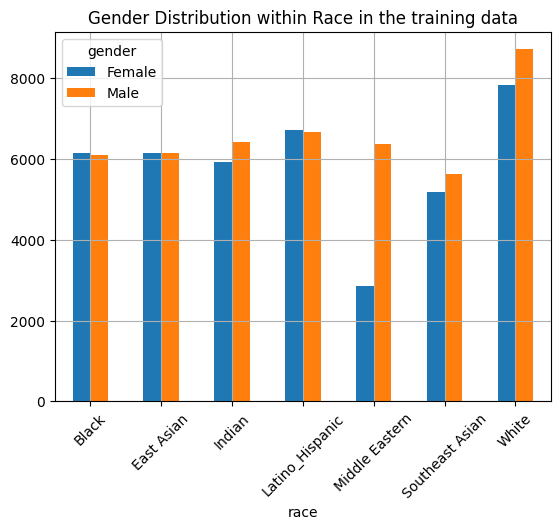

In [ ]:
label_train_data.groupby('race')['gender'].value_counts().unstack().plot(kind='bar', stacked=False,grid = True, rot = 45, title = "Gender Distribution within Race in the training data")

In [ ]:
label_train_data.isna().mean()

,0
file,0.0
age,0.0
gender,0.0
race,0.0
service_test,0.0


In [ ]:
def class_imbalance_measures(df, column):
    """
    Calculates class imbalance measures for a given column in a DataFrame.

    Args:
        df: pandas DataFrame
        column: The name of the column to analyze

    Returns:
        A dictionary containing the imbalance measures.
    """

    counts = df[column].value_counts()
    total = len(df)
    ratios = counts / total

    # Ratio Analysis
    max_ratio = ratios.max()
    min_ratio = ratios.min()
    ratio_range = max_ratio - min_ratio

    # Coefficient of Variation
    coefficient_of_variation = np.std(ratios) / np.mean(ratios) if np.mean(ratios) != 0 else 0

    # Entropy
    entropy = -np.sum(ratios * np.log2(ratios)) if np.all(ratios > 0) else 0


    # Gini Index
    gini_index = 1 - np.sum(ratios**2)

    return {
        'Column': column,
        'Max Ratio': max_ratio,
        'Min Ratio': min_ratio,
        'Ratio Range': ratio_range,
        'Coefficient of Variation': coefficient_of_variation,
        'Entropy': entropy,
        'Gini Index': gini_index,
    }


# Example usage
imbalance_results = []

for col in ['age', 'gender', 'race']:
    imbalance_results.append(class_imbalance_measures(label_train_data, col))

# Create a DataFrame to display the results
imbalance_df_train = pd.DataFrame(imbalance_results)
imbalance_df_train

,Column,Max Ratio,Min Ratio,Ratio Range,Coefficient of Variation,Entropy,Gini Index
0,age,0.295098,0.009707,0.285391,0.808729,2.695531,0.816217
1,gender,0.530135,0.469865,0.060269,0.060269,0.997378,0.498184
2,race,0.190526,0.106244,0.084282,0.169074,2.787104,0.853059


### Validation data

In [ ]:
label_val_data = pd.read_csv('fairface_label_val.csv')
label_val_data.head()

,file,age,gender,race,service_test
0,val/1.jpg,3-9,Male,East Asian,False
1,val/2.jpg,50-59,Female,East Asian,True
2,val/3.jpg,30-39,Male,White,True
3,val/4.jpg,20-29,Female,Latino_Hispanic,True
4,val/5.jpg,20-29,Male,Southeast Asian,False


In [ ]:
label_val_data['age'] = label_val_data['age'].replace('more than 70', '70+')

<Axes: title={'center': 'Age Distribution in Validation Data'}, xlabel='age', ylabel='Count'>

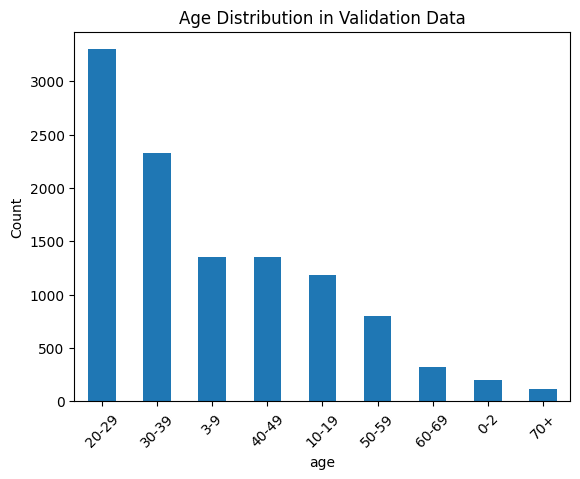

In [ ]:
# plot the bar graph for age
label_val_data['age'].value_counts().plot(kind='bar', rot = 45, ylabel='Count', title='Age Distribution in Validation Data')

<Axes: title={'center': 'Gender Distribution in Validation data'}, xlabel='gender', ylabel='Count'>

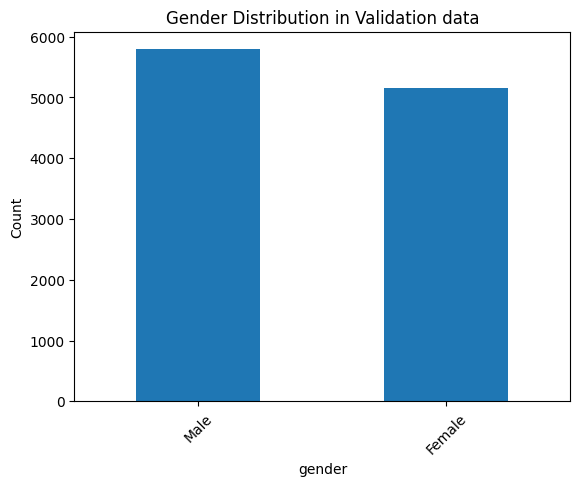

In [ ]:
# plot the bar graph for age
label_val_data['gender'].value_counts().plot(kind='bar', rot = 45, ylabel = 'Count', title= "Gender Distribution in Validation data")

<Axes: title={'center': 'Race Distribution in Validation Data'}, xlabel='race', ylabel='Count'>

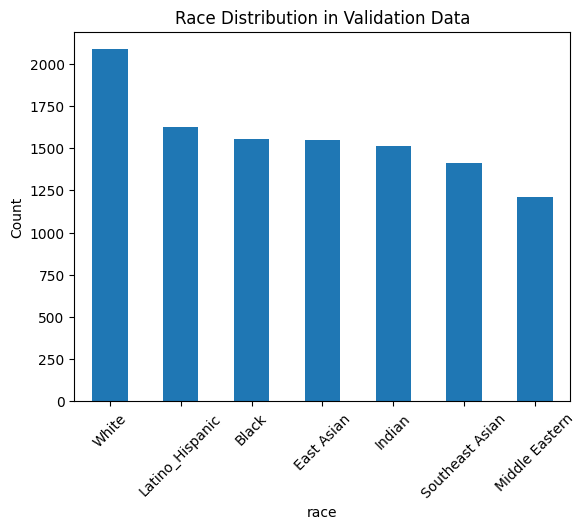

In [ ]:
# plot the bar graph for age
label_val_data['race'].value_counts().plot(kind='bar',rot = 45, ylabel = "Count", title = 'Race Distribution in Validation Data')

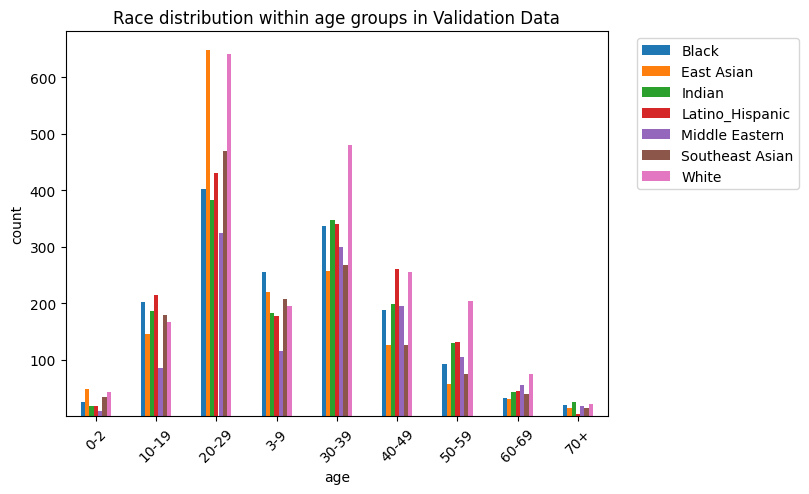

In [ ]:
# plot the age graph for race
label_val_data.groupby('age')['race'].value_counts().unstack().plot(kind='bar',title = "Race distribution within age groups in Validation Data", stacked=False,grid = False, rot = 45, figsize=(7,5),ylabel = 'count',yticks = list(range(100,700,100)))
plt.legend(bbox_to_anchor=(1.04, 1), loc="upper left")

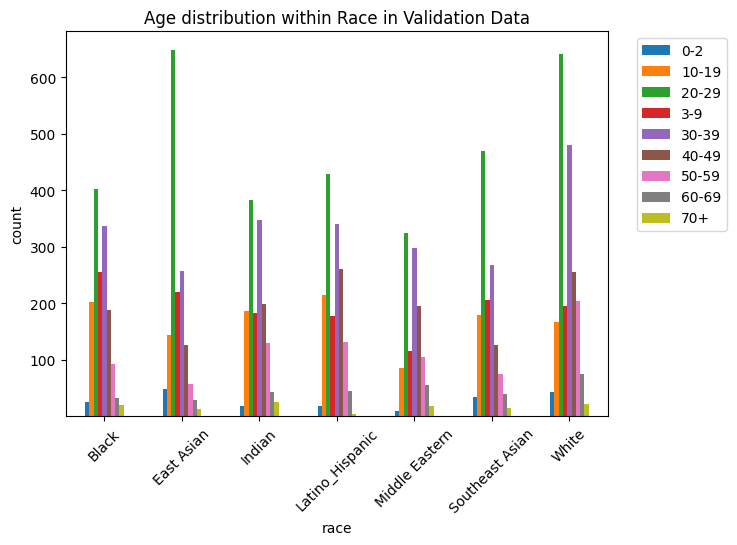

In [ ]:
# make a plot for age and race
label_val_data.groupby('race')['age'].value_counts().unstack().plot(kind='bar', title ="Age distribution within Race in Validation Data", stacked=False,grid = False, rot = 45, figsize = (7,5), yticks = list(range(100,700,100)),ylabel = 'count')
plt.legend(bbox_to_anchor=(1.04, 1), loc="upper left")

<Axes: title={'center': 'Gender Distribution within Age group in Validation Data'}, xlabel='age', ylabel='Count'>

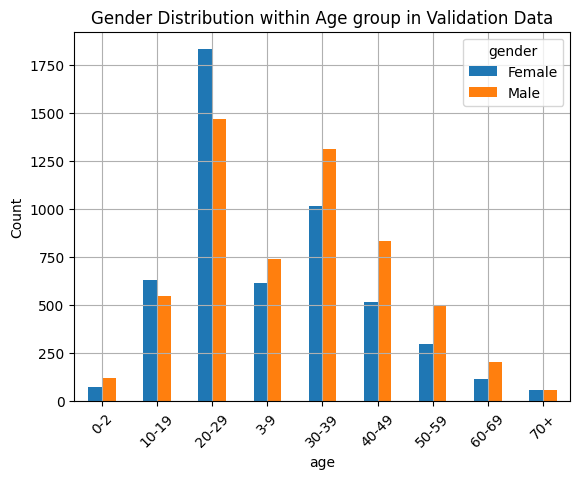

In [ ]:
label_val_data.groupby('age')['gender'].value_counts().unstack().plot(kind='bar', stacked=False,grid = True, ylabel = 'Count', title = "Gender Distribution within Age group in Validation Data", rot = 45)

<Axes: title={'center': 'Gender Distribution within Race in Validation Data'}, xlabel='race'>

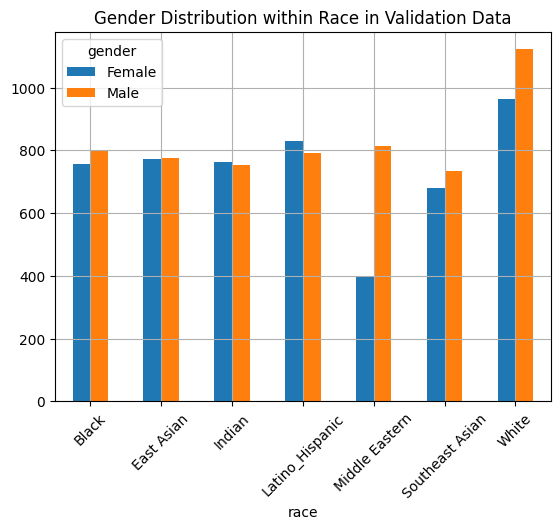

In [ ]:
label_val_data.groupby('race')['gender'].value_counts().unstack().plot(kind='bar', stacked=False,grid = True, rot = 45, title = "Gender Distribution within Race in Validation Data")

In [ ]:
label_val_data.isna().mean()

,0
file,0.0
age,0.0
gender,0.0
race,0.0
service_test,0.0


In [ ]:
# Example usage
imbalance_results = []

for col in ['age', 'gender', 'race']:
    imbalance_results.append(class_imbalance_measures(label_val_data, col))

# Create a DataFrame to display the results
imbalance_df_val = pd.DataFrame(imbalance_results)
imbalance_df_val

,Column,Max Ratio,Min Ratio,Ratio Range,Coefficient of Variation,Entropy,Gini Index
0,age,0.301260,0.010772,0.290487,0.814326,2.688250,0.815208
1,gender,0.528757,0.471243,0.057513,0.057513,0.997613,0.498346
2,race,0.190341,0.110371,0.079971,0.157591,2.790038,0.853595


In [ ]:
imbalance_df_train

,Column,Max Ratio,Min Ratio,Ratio Range,Coefficient of Variation,Entropy,Gini Index
0,age,0.295098,0.009707,0.285391,0.808729,2.695531,0.816217
1,gender,0.530135,0.469865,0.060269,0.060269,0.997378,0.498184
2,race,0.190526,0.106244,0.084282,0.169074,2.787104,0.853059


In [ ]:
# calculate Population Stability Index (PSI) between train and validation data for age, gender and race
# psi = \sum_i (pi - qi) log(pi/qi); for all classes i and proportion pi and qi
# psi < 0.1 => no significant imbalance
# psi > 0.2 => Large imbalance
def psi(train_data, val_data):
    train_counts = train_data.value_counts()
    val_counts = val_data.value_counts()
    total_train = train_counts.sum()
    total_val = val_counts.sum()
    train_proportions = train_counts / total_train
    val_proportions = val_counts / total_val
    psi_values = (train_proportions - val_proportions) * np.log(train_proportions / val_proportions)
    return psi_values.sum()

age_psi = psi(label_train_data['age'], label_val_data['age'])
gender_psi = psi(label_train_data['gender'], label_val_data['gender'])
race_psi = psi(label_train_data['race'], label_val_data['race'])

print(f'PSI between train and validation data for age: {age_psi}')
print(f'PSI between train and validation data for gender: {gender_psi}')
print(f'PSI between train and validation data for race: {race_psi}')


PSI between train and validation data for age: 0.0014003686021009441
PSI between train and validation data for gender: 7.622312641548715e-06
PSI between train and validation data for race: 0.0006677295882994669


## Process the data for training and validation

In [ ]:
class FairFaceMultiTaskDataset(Dataset):
    def __init__(self, dataframe, root_dir, transform=None):
        self.annotations = dataframe
        self.root_dir = root_dir
        self.transform = transform

        # Define mappings for age and ethnicity
        self.age_mapping = {'0-2': 0, '3-9': 1, '10-19': 2, '20-29': 3, '30-39': 4, '40-49': 5, '50-59': 6, '60-69': 7, '70+': 8}
        self.ethnicity_mapping = {'White': 0, 'Black': 1, 'Latino_Hispanic': 2, 'East Asian': 3, 'Southeast Asian': 4, 'Indian': 5, 'Middle Eastern': 6}

    def __len__(self):
        return len(self.annotations)

    def __getitem__(self, idx):
        img_path = os.path.join(self.root_dir, self.annotations.iloc[idx, 0])
        image = Image.open(img_path).convert("RGB")

        # Extract labels for gender, age, and ethnicity
        gender_label = 0 if self.annotations.iloc[idx, 2] == 'Male' else 1
        age_label = self.age_mapping[self.annotations.iloc[idx, 1]]
        ethnicity_label = self.ethnicity_mapping[self.annotations.iloc[idx, 3]]

        if self.transform:
            image = self.transform(image)

        return image, (gender_label, age_label, ethnicity_label)

# Define augmentation pipeline
train_transforms = transforms.Compose([
    transforms.ToTensor(),                    # Convert image to tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])   # Standardize
])


val_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])


# Load dataset
train_dataset = FairFaceMultiTaskDataset(dataframe=label_train_data, root_dir='/content', transform=train_transforms)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_dataset =  FairFaceMultiTaskDataset(dataframe=label_val_data, root_dir='/content', transform=val_transform)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False)

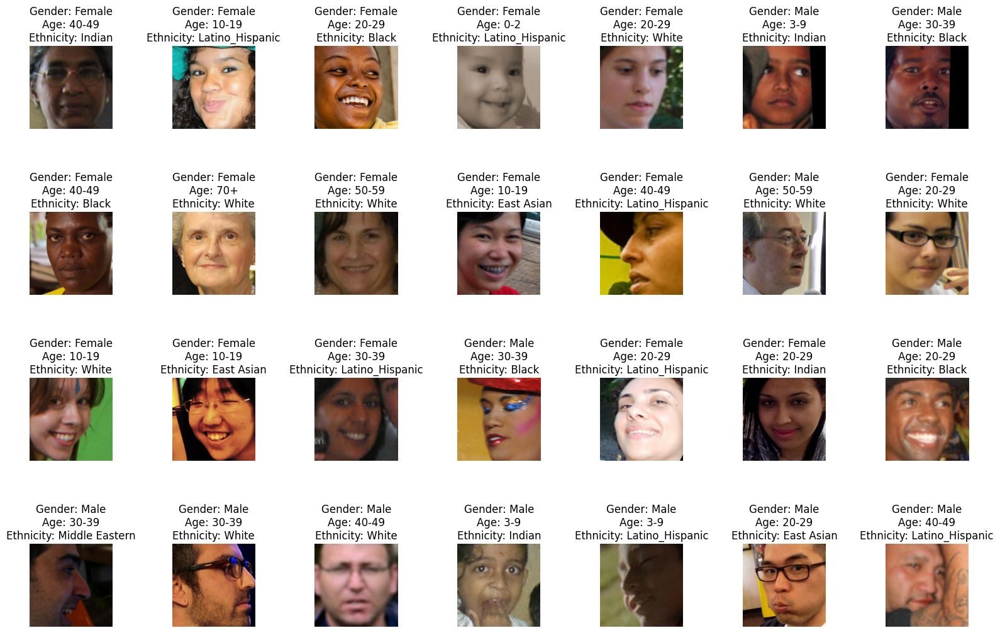

In [ ]:
from torchvision.utils import make_grid

# Get a batch of training data
dataiter = iter(train_loader)
images, labels = next(dataiter)

num_images = 7 # number of images in each row
num_row = 4 # number of row
# Unnormalize the images
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]
unnormalize = transforms.Normalize([-mean[0]/std[0], -mean[1]/std[1], -mean[2]/std[2]], [1/std[0], 1/std[1], 1/std[2]])
unnormalized_images = unnormalize(images[:num_images*num_row])


# label mappings
age_mapping = {'0-2': 0, '3-9': 1, '10-19': 2, '20-29': 3, '30-39': 4, '40-49': 5, '50-59': 6, '60-69': 7, '70+': 8}
gender_mapping = {'Male': 0, 'Female': 1}
ethnicity_mapping = {'White': 0, 'Black': 1, 'Latino_Hispanic': 2, 'East Asian': 3, 'Southeast Asian': 4, 'Indian': 5, 'Middle Eastern': 6}

# inverse label mappings
age_mapping_inv = {v: k for k, v in age_mapping.items()}
gender_mapping_inv = {v: k for k, v in gender_mapping.items()}
ethnicity_mapping_inv = {v: k for k, v in ethnicity_mapping.items()}

# Labels for the first num_images*num_row images
gender_labels = labels[0][:num_images*num_row]
age_labels = labels[1][:num_images*num_row]
ethnicity_labels = labels[2][:num_images*num_row]

# Apply inverse mapping on the labels
gender_labels = [gender_mapping_inv[label.item()] for label in labels[0][:num_images*num_row]]
age_labels = [age_mapping_inv[label.item()] for label in labels[1][:num_images*num_row]]
ethnicity_labels = [ethnicity_mapping_inv[label.item()] for label in labels[2][:num_images*num_row]]

fig, axes = plt.subplots(num_row, num_images, figsize=(20, 12))

for j in range(num_row):
    for i in range(num_images):
        axes[j, i].imshow(np.transpose(unnormalized_images[i+j*num_images].numpy(), (1, 2 ,0)))
        axes[j, i].set_title((f"Gender: {gender_labels[i+j*num_images]}\nAge: {age_labels[i+j*num_images]}\nEthnicity: {ethnicity_labels[i+j*num_images]}"))
        axes[j, i].axis('off')
        # set distance between rows
        plt.subplots_adjust(hspace=1)

for ax in axes.flat:
    ax.title.set_fontsize(12)
plt.show()

## Define the CNN model

In [ ]:
# simple model
# class CNN(nn.Module):
#     def __init__(self, input_size, num_age_classes, num_ethnicity_classes ):
#         super(CNN, self).__init__()
#         self.conv1 = nn.Conv2d(in_channels=3, out_channels=12, kernel_size=3,padding=0)
#         self.conv2 = nn.Conv2d(in_channels=12, out_channels=24, kernel_size=6,padding=0)
#         self.conv3 = nn.Conv2d(in_channels=24, out_channels=32, kernel_size=6,padding=0)
#         self.fc1 = nn.Linear(8*4*4, 200)
#         self.fc2 = nn.Linear(200, 10)

#         # Task-specific output layers
#         self.gender_fc = nn.Linear(10, 2)              # Output for gender classification (2 classes)
#         self.age_fc = nn.Linear(10, num_age_classes)   # Output for age classification
#         self.ethnicity_fc = nn.Linear(10, num_ethnicity_classes)  # Output for ethnicity classification

#     def forward(self, x, verbose=False):
#         x = self.conv1(x)
#         x = F.relu(x)
#         x = self.conv2(x)
#         x = F.relu(x)
#         x = F.max_pool2d(x, kernel_size=2)
#         x = self.conv3(x)
#         x = F.relu(x)
#         x = F.max_pool2d(x, kernel_size=2)
#         x = x.view(-1, 8*4*4)
#         x = self.fc1(x)
#         x = F.relu(x)
#         x = self.fc2(x)

#         # Task-specific outputs
#         gender_output = self.gender_fc(x)
#         age_output = self.age_fc(x)
#         ethnicity_output = self.ethnicity_fc(x)

#         return gender_output, age_output, ethnicity_output

In [ ]:
# # more complex model
# class DepthwiseSeparableConv(nn.Module):
#     def __init__(self, in_channels, out_channels, stride=1):
#         super(DepthwiseSeparableConv, self).__init__()
#         self.depthwise = nn.Conv2d(in_channels, in_channels, kernel_size=3, stride=stride, padding=1, groups=in_channels, bias=False)
#         self.pointwise = nn.Conv2d(in_channels, out_channels, kernel_size=1, bias=False)
#         self.bn = nn.BatchNorm2d(out_channels)
#         self.relu = nn.ReLU(inplace=True)

#     def forward(self, x):
#         x = self.depthwise(x)
#         x = self.pointwise(x)
#         x = self.bn(x)
#         return self.relu(x)

# class LightweightMTLNet224(nn.Module):
#     def __init__(self, num_classes_gender=2, num_classes_age=9, num_classes_ethnicity=7):
#         super(LightweightMTLNet224, self).__init__()

#         # Input layer
#         self.conv1 = DepthwiseSeparableConv(3, 32, stride=2)  # Output: 112x112
#         self.conv2 = DepthwiseSeparableConv(32, 64, stride=2)  # Output: 56x56
#         self.conv3 = DepthwiseSeparableConv(64, 128, stride=2) # Output: 28x28
#         self.conv4 = DepthwiseSeparableConv(128, 256, stride=2) # Output: 14x14
#         self.conv5 = DepthwiseSeparableConv(256, 512, stride=2) # Output: 7x7

#         # Pooling layer to reduce size to 1x1
#         self.avgpool = nn.AdaptiveAvgPool2d((1, 1))

#         # Task-specific classifiers
#         self.gender_fc1 = nn.Linear(512, 256)
#         self.age_fc1 = nn.Linear(512, 256)
#         self.ethnicity_fc1 = nn.Linear(512, 256)

#         self.gender_fc2 = nn.Linear(256, num_classes_gender)
#         self.age_fc2 = nn.Linear(256, num_classes_age)
#         self.ethnicity_fc2 = nn.Linear(256, num_classes_ethnicity)

#     def forward(self, x):
#         # Pass through the convolutional layers
#         x = self.conv1(x)
#         x = self.conv2(x)
#         x = self.conv3(x)
#         x = self.conv4(x)
#         x = self.conv5(x)

#         # Global average pooling
#         x = self.avgpool(x)
#         x = torch.flatten(x, 1)

#         # Multi-task outputs
#         gender = self.gender_fc1(x)
#         age = self.age_fc1(x)
#         ethnicity = self.ethnicity_fc1(x)

#         gender = F.relu(gender)
#         age = F.relu(age)
#         ethnicity = F.relu(ethnicity)

#         gender = self.gender_fc2(gender)
#         age = self.age_fc2(age)
#         ethnicity = self.ethnicity_fc2(ethnicity)

#         return gender, age, ethnicity


In [ ]:
class DepthwiseSeparableConv(nn.Module):
    def __init__(self, in_channels, out_channels, stride=1):
        super(DepthwiseSeparableConv, self).__init__()
        self.depthwise = nn.Conv2d(in_channels, in_channels, kernel_size=3, stride=stride, padding=1, groups=in_channels, bias=False)
        self.pointwise = nn.Conv2d(in_channels, out_channels, kernel_size=1, bias=False)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.depthwise(x)
        x = self.pointwise(x)
        x = self.bn(x)
        return self.relu(x)

# Updated model definition with more depth and complexity
class LightweightMTLNet224(nn.Module):
    def __init__(self, num_classes_gender=2, num_classes_age=9, num_classes_ethnicity=7):
        super(LightweightMTLNet224, self).__init__()

        # Input layer
        self.conv1 = DepthwiseSeparableConv(3, 64, stride=2)  # Increased output channels
        self.conv2 = DepthwiseSeparableConv(64, 128, stride=1) # Added another layer
        self.conv3 = DepthwiseSeparableConv(128, 128, stride=2)
        self.conv4 = DepthwiseSeparableConv(128, 256, stride=1) # Added another layer
        self.conv5 = DepthwiseSeparableConv(256, 256, stride=2)
        self.conv6 = DepthwiseSeparableConv(256, 512, stride=1) # Added another layer
        self.conv7 = DepthwiseSeparableConv(512, 512, stride=2)

        # Pooling layer
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))

        # Task-specific classifiers
        self.fc = nn.Linear(512, 256)

        self.gender_fc = nn.Linear(256, num_classes_gender)
        self.age_fc = nn.Linear(256, num_classes_age)
        self.ethnicity_fc = nn.Linear(256, num_classes_ethnicity)

    def forward(self, x):
        # Pass through the convolutional layers
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.conv5(x)
        x = self.conv6(x)
        x = self.conv7(x)

        # Global average pooling
        x = self.avgpool(x)
        x = torch.flatten(x, 1)

        # Fully connected layers
        x = F.relu(self.fc(x),inplace=False) # Added ReLU activation

        # Multi-task outputs
        gender = self.gender_fc(x)
        age = self.age_fc(x)
        ethnicity = self.ethnicity_fc(x)

        return gender, age, ethnicity

In [ ]:
# Define number of classes for each task
num_age_classes = 9         # Example: 9 age ranges (adjust as per your data)
num_ethnicity_classes = 7   # Example: 7 ethnicity classes

# Initialize model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


### Initialize the model

In [ ]:
# Instantiate and check the number of trainable parameters
# model = CNN(28*28,num_age_classes,num_ethnicity_classes).to(device)
model = LightweightMTLNet224(num_classes_gender=2, num_classes_age=num_age_classes, num_classes_ethnicity=num_ethnicity_classes).to(device)
print(f"Number of trainable parameters: {sum(p.numel() for p in model.parameters() if p.requires_grad)}")

Number of trainable parameters: 668077


In [ ]:
print(model)

LightweightMTLNet224(
  (conv1): DepthwiseSeparableConv(
    (depthwise): Conv2d(3, 3, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), groups=3, bias=False)
    (pointwise): Conv2d(3, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
  )
  (conv2): DepthwiseSeparableConv(
    (depthwise): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=64, bias=False)
    (pointwise): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
  )
  (conv3): DepthwiseSeparableConv(
    (depthwise): Conv2d(128, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), groups=128, bias=False)
    (pointwise): Conv2d(128, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, 

### Loss functions and optimizer

In [ ]:
# Loss functions for each output
gender_criterion = nn.CrossEntropyLoss()
age_criterion = nn.CrossEntropyLoss()
ethnicity_criterion = nn.CrossEntropyLoss()

# Optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

### Function for model evaluation

In [ ]:
def evaluate(model, val_loader):
    model.eval()
    gender_correct, age_correct, ethnicity_correct = 0, 0, 0
    total = 0

    with torch.no_grad():
        for images, (gender_labels, age_labels, ethnicity_labels) in val_loader:
            images = images.to(device)
            gender_labels = gender_labels.to(device)
            age_labels = age_labels.to(device)
            ethnicity_labels = ethnicity_labels.to(device)

            gender_output, age_output, ethnicity_output = model(images)

            # Calculate accuracy for each task
            gender_correct += (gender_output.argmax(1) == gender_labels).sum().item()
            age_correct += (age_output.argmax(1) == age_labels).sum().item()
            ethnicity_correct += (ethnicity_output.argmax(1) == ethnicity_labels).sum().item()
            total += gender_labels.size(0)

    print(f"Gender Accuracy: {100 * gender_correct / total:.2f}%")
    print(f"Age Accuracy: {100 * age_correct / total:.2f}%")
    print(f"Ethnicity Accuracy: {100 * ethnicity_correct / total:.2f}%")


In [ ]:
len(train_dataset)

86744

In [ ]:
len(val_dataset)

10954

In [ ]:
# Total number of images
10954+86744

97698

## Training the model and evaluation

In [ ]:
num_epochs = 10
losses = []
test_losses = []
losses_gender = []
losses_age = []
losses_ethnicity = []
test_losses_gender = []
test_losses_age = []
test_losses_ethnicity = []

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    running_loss_gender = 0.0
    running_loss_age = 0.0
    running_loss_ethnicity = 0.0

    batch_idx = 1
    for images, (gender_labels, age_labels, ethnicity_labels) in train_loader:
        images = images.to(device)
        gender_labels = gender_labels.to(device)
        age_labels = age_labels.to(device)
        ethnicity_labels = ethnicity_labels.to(device)

        optimizer.zero_grad()

        # Forward pass
        gender_output, age_output, ethnicity_output = model(images)

        # Compute individual losses and combine them
        gender_loss = gender_criterion(gender_output, gender_labels)
        age_loss = age_criterion(age_output, age_labels)
        ethnicity_loss = ethnicity_criterion(ethnicity_output, ethnicity_labels)

        total_loss = gender_loss + age_loss + ethnicity_loss
        total_loss.backward()
        optimizer.step()

        if batch_idx % 200 == 0:
            print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f} \tGender Loss: {:.6f} \tAge Loss: {:.6f}\tEthnicity Loss: {:.6f}'.format(
                epoch+1, batch_idx * len(gender_labels), len(train_dataset),
                100. * batch_idx / len(train_loader), total_loss.item(),
                gender_loss.item(), age_loss.item(), ethnicity_loss.item()))
        batch_idx += 1

        running_loss += total_loss.item()
        running_loss_gender += gender_loss.item()
        running_loss_age += age_loss.item()
        running_loss_ethnicity += ethnicity_loss.item()

    losses.append(running_loss/len(train_loader))
    losses_gender.append(running_loss_gender/len(train_loader))
    losses_age.append(running_loss_age/len(train_loader))
    losses_ethnicity.append(running_loss_ethnicity/len(train_loader))

    print(f"Epoch [{epoch+1}/{num_epochs}], Training Loss: {running_loss/len(train_loader):.4f}, Gender Loss: {running_loss_gender/len(train_loader):.4f}, Age Loss: {running_loss_age/len(train_loader):.4f}, Ethnicity Loss: {running_loss_ethnicity/len(train_loader):.4f}")

    running_loss = 0.0
    running_loss_gender = 0.0
    running_loss_age = 0.0
    running_loss_ethnicity = 0.0

    for images, (gender_labels, age_labels, ethnicity_labels) in val_loader:

        images = images.to(device)
        gender_labels = gender_labels.to(device)
        age_labels = age_labels.to(device)
        ethnicity_labels = ethnicity_labels.to(device)

        gender_output, age_output, ethnicity_output = model(images)

        # Compute individual losses and combine them
        gender_loss = gender_criterion(gender_output, gender_labels)
        age_loss = age_criterion(age_output, age_labels)
        ethnicity_loss = ethnicity_criterion(ethnicity_output, ethnicity_labels)

        total_loss = gender_loss + age_loss + ethnicity_loss

        running_loss += total_loss.item()
        running_loss_gender += gender_loss.item()
        running_loss_age += age_loss.item()
        running_loss_ethnicity += ethnicity_loss.item()

    test_losses.append(running_loss/len(val_loader))
    test_losses_gender.append(running_loss_gender/len(val_loader))
    test_losses_age.append(running_loss_age/len(val_loader))
    test_losses_ethnicity.append(running_loss_ethnicity/len(val_loader))
    print(f"Epoch [{epoch+1}/{num_epochs}], Test Loss: {running_loss/len(val_loader):.4f}, Gender Loss: {running_loss_gender/len(val_loader):.4f}, Age Loss: {running_loss_age/len(val_loader):.4f}, Ethnicity Loss: {running_loss_ethnicity/len(val_loader):.4f}")

    evaluate(model, val_loader)

    # stopping criteria
    if len(losses) > 1 and (losses[-1] > losses[-2] or losses[-2] - losses[-1] < 0.1):
        print("Early stopping triggered")
        break

Train Epoch: 1 [6400/86744 (7%)]	Loss: 4.154361 	Gender Loss: 0.591018 	Age Loss: 1.638000	Ethnicity Loss: 1.925343
Train Epoch: 1 [12800/86744 (15%)]	Loss: 4.908699 	Gender Loss: 0.747751 	Age Loss: 2.144671	Ethnicity Loss: 2.016277
Train Epoch: 1 [19200/86744 (22%)]	Loss: 3.777718 	Gender Loss: 0.718081 	Age Loss: 1.605857	Ethnicity Loss: 1.453780
Train Epoch: 1 [25600/86744 (30%)]	Loss: 4.030455 	Gender Loss: 0.690038 	Age Loss: 1.725972	Ethnicity Loss: 1.614445
Train Epoch: 1 [32000/86744 (37%)]	Loss: 3.821492 	Gender Loss: 0.587991 	Age Loss: 1.535025	Ethnicity Loss: 1.698475
Train Epoch: 1 [38400/86744 (44%)]	Loss: 4.138261 	Gender Loss: 0.569261 	Age Loss: 1.654773	Ethnicity Loss: 1.914227
Train Epoch: 1 [44800/86744 (52%)]	Loss: 3.588709 	Gender Loss: 0.483001 	Age Loss: 1.507859	Ethnicity Loss: 1.597850
Train Epoch: 1 [51200/86744 (59%)]	Loss: 3.818969 	Gender Loss: 0.473450 	Age Loss: 1.434158	Ethnicity Loss: 1.911361
Train Epoch: 1 [57600/86744 (66%)]	Loss: 3.338484 	Gender 

### Training vs test losses

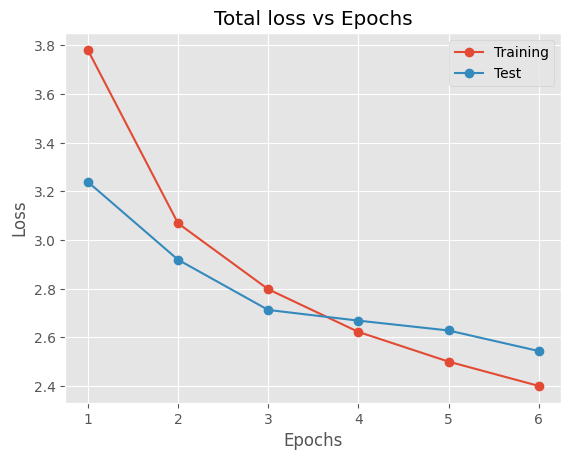

In [ ]:
# plot the losses vs the number of epochs
epochs = list(range(1, len(losses)+1))
plt.plot(epochs,losses,marker = 'o')
plt.plot(epochs,test_losses, marker = 'o')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Total loss vs Epochs")
plt.legend(['Training','Test'])
plt.grid('True')
plt.show()

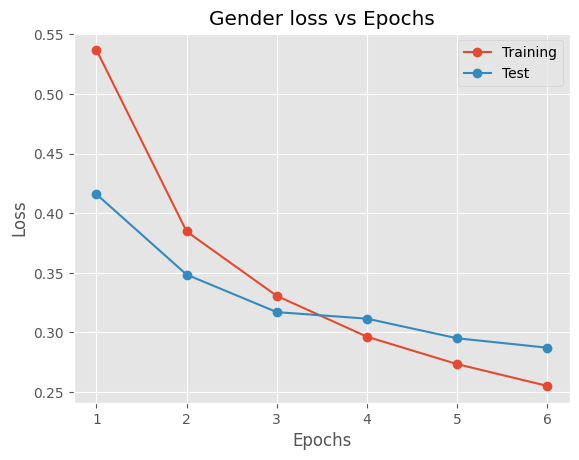

In [ ]:
# plot the losses vs the number of epochs
epochs = list(range(1, len(losses)+1))
plt.plot(epochs,losses_gender,marker = 'o')
plt.plot(epochs,test_losses_gender, marker = 'o')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Gender loss vs Epochs")
plt.legend(['Training','Test'])
plt.grid('True')
plt.show()

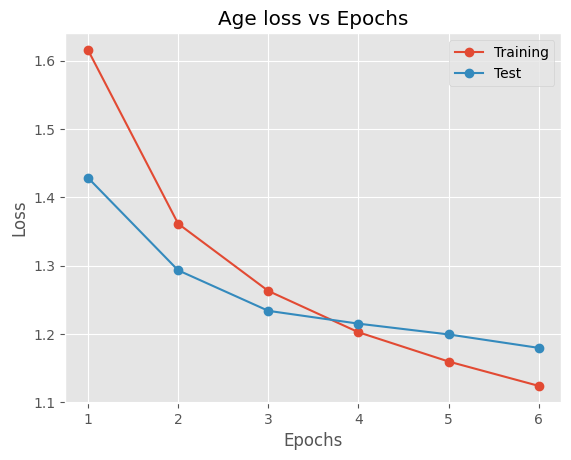

In [ ]:
# plot the losses vs the number of epochs
epochs = list(range(1, len(losses)+1))
plt.plot(epochs,losses_age,marker = 'o')
plt.plot(epochs,test_losses_age, marker = 'o')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Age loss vs Epochs")
plt.legend(['Training','Test'])
plt.grid('True')
plt.show()

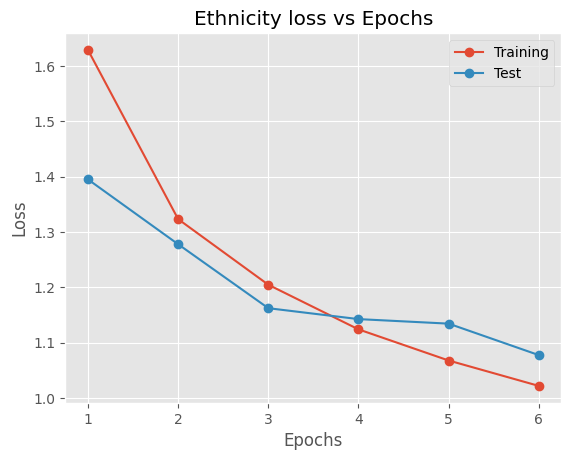

In [ ]:
# plot the losses vs the number of epochs
epochs = list(range(1, len(losses)+1))
plt.plot(epochs,losses_ethnicity,marker = 'o')
plt.plot(epochs,test_losses_ethnicity, marker = 'o')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Ethnicity loss vs Epochs")
plt.legend(['Training','Test'])
plt.grid('True')
plt.show()

In [ ]:
# Run evaluation
evaluate(model, val_loader)

Gender Accuracy: 87.35%
Age Accuracy: 50.83%
Ethnicity Accuracy: 59.33%


In [ ]:
# confusion matrix for gender, age and ethnicity prediction
from sklearn.metrics import confusion_matrix
import seaborn as sns

def plot_confusion_matrix(y_true, y_pred, labels, title, ax = None):
    cm = confusion_matrix(y_true, y_pred)

    # Check if ax is provided, otherwise create a new figure
    if ax is None:
        plt.figure(figsize=(7, 5))
    else:
        # Set current axes to the provided ax
        plt.sca(ax) # Changed plt.figure() to plt.sca() to set the current axes

    # plt.figure(figsize=(7, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=labels, yticklabels=labels)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title(title)
    # plt.show()

In [ ]:
# Prediction and True values
y_true_gender = []
y_true_age = []
y_true_ethnicity = []
y_pred_gender = []
y_pred_age = []
y_pred_ethnicity = []

# Prediction and True Values given gender
y_true_age_male = []
y_true_age_female = []
y_pred_age_male = []
y_pred_age_female = []
y_true_ethnicity_male = []
y_true_ethnicity_female = []
y_pred_ethnicity_male = []
y_pred_ethnicity_female = []

model.eval()
with torch.no_grad():
    for images, (gender_labels, age_labels, ethnicity_labels) in val_loader:
        images = images.to(device)
        gender_labels = gender_labels.to(device)
        age_labels = age_labels.to(device)
        ethnicity_labels = ethnicity_labels.to(device)

        gender_output, age_output, ethnicity_output = model(images)
        _, predicted_genders = torch.max(gender_output, 1)
        _, predicted_ages = torch.max(age_output, 1)
        _, predicted_ethnicities = torch.max(ethnicity_output, 1)
        y_true_gender.extend(gender_labels.cpu().numpy())
        y_true_age.extend(age_labels.cpu().numpy())
        y_true_ethnicity.extend(ethnicity_labels.cpu().numpy())
        y_pred_gender.extend(predicted_genders.cpu().numpy())
        y_pred_age.extend(predicted_ages.cpu().numpy())
        y_pred_ethnicity.extend(predicted_ethnicities.cpu().numpy())
        _, predicted_ages = torch.max(age_output, 1)
        y_true_age_male.extend(age_labels[gender_labels == 0].cpu().numpy())
        y_true_age_female.extend(age_labels[gender_labels == 1].cpu().numpy())
        y_pred_age_male.extend(predicted_ages[gender_labels == 0].cpu().numpy())
        y_pred_age_female.extend(predicted_ages[gender_labels == 1].cpu().numpy())
        y_true_ethnicity_male.extend(ethnicity_labels[gender_labels == 0].cpu().numpy())
        y_true_ethnicity_female.extend(ethnicity_labels[gender_labels == 1].cpu().numpy())
        y_pred_ethnicity_male.extend(predicted_ethnicities[gender_labels == 0].cpu().numpy())
        y_pred_ethnicity_female.extend(predicted_ethnicities[gender_labels == 1].cpu().numpy())

# Convert to numpy arrays
y_true_gender = np.array(y_true_gender)
y_true_age = np.array(y_true_age)
y_true_ethnicity = np.array(y_true_ethnicity)
y_pred_gender = np.array(y_pred_gender)
y_pred_age = np.array(y_pred_age)
y_pred_ethnicity = np.array(y_pred_ethnicity)
y_true_age_male = np.array(y_true_age_male)
y_true_age_female = np.array(y_true_age_female)
y_pred_age_male = np.array(y_pred_age_male)
y_pred_age_female = np.array(y_pred_age_female)
y_true_age_male = np.array(y_true_age_male)
y_true_age_female = np.array(y_true_age_female)
y_pred_age_male = np.array(y_pred_age_male)
y_pred_age_female = np.array(y_pred_age_female)


# Plot confusion matrices
age_labels = list(age_mapping.keys())
gender_labels = list(gender_mapping.keys())
ethnicity_labels = list(ethnicity_mapping.keys())


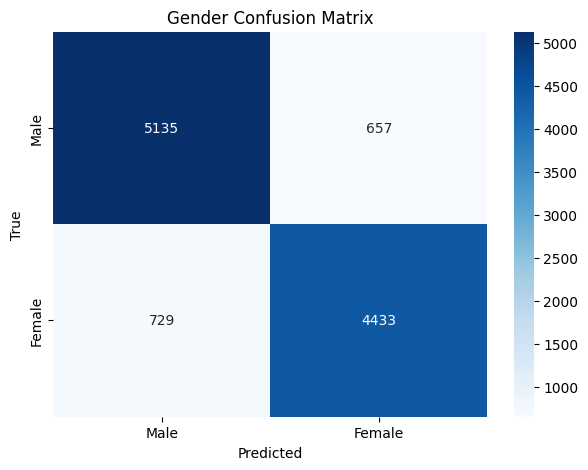

In [ ]:
plot_confusion_matrix(y_true_gender, y_pred_gender, gender_labels, "Gender Confusion Matrix")

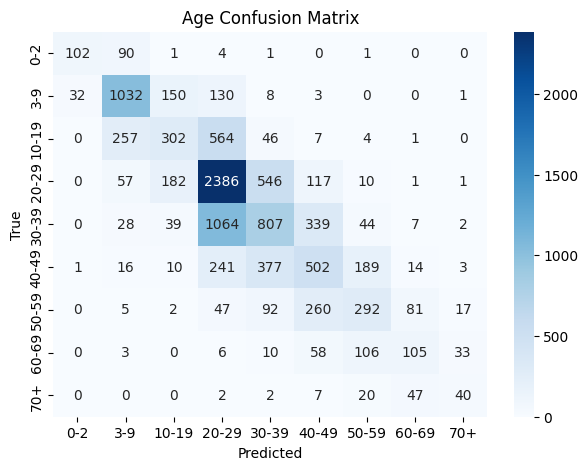

In [ ]:
plot_confusion_matrix(y_true_age, y_pred_age, age_labels, "Age Confusion Matrix")

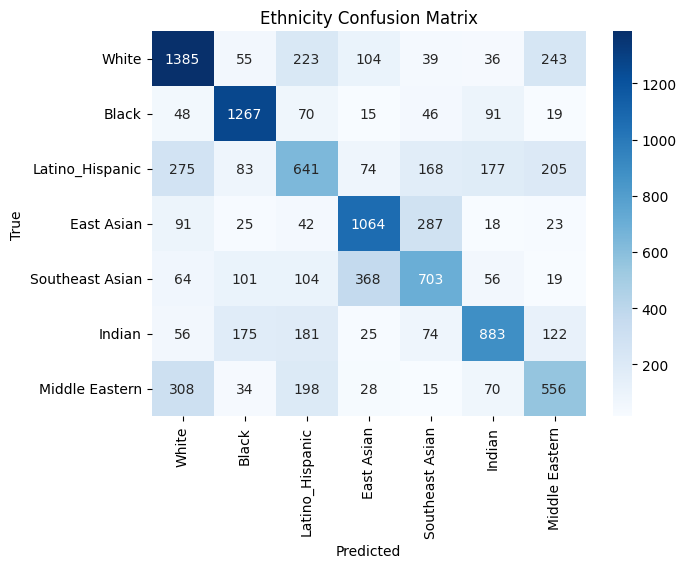

In [ ]:
plot_confusion_matrix(y_true_ethnicity, y_pred_ethnicity, ethnicity_labels, "Ethnicity Confusion Matrix")

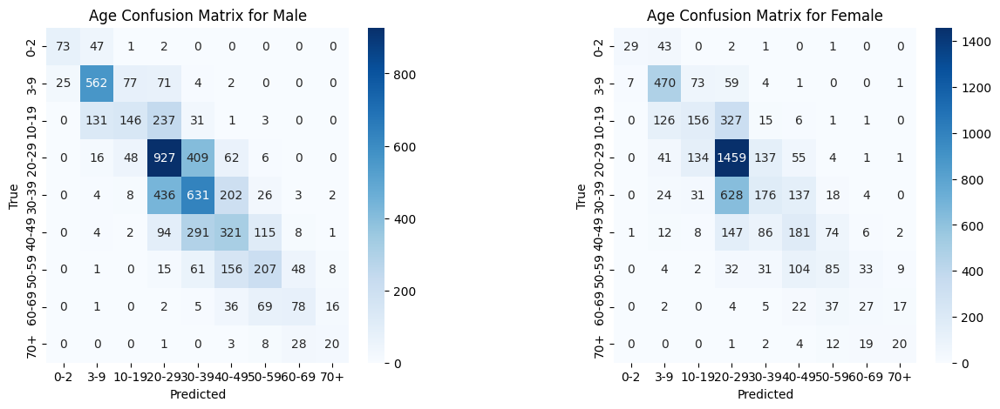

In [ ]:
# plot age confusion matrices for the two gender side by side
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
plot_confusion_matrix(y_true_age_male, y_pred_age_male, age_labels, "Age Confusion Matrix for Male", ax=axes[0])
plot_confusion_matrix(y_true_age_female, y_pred_age_female, age_labels, "Age Confusion Matrix for Female", ax=axes[1])
plt.subplots_adjust(wspace=0.5)
plt.show()

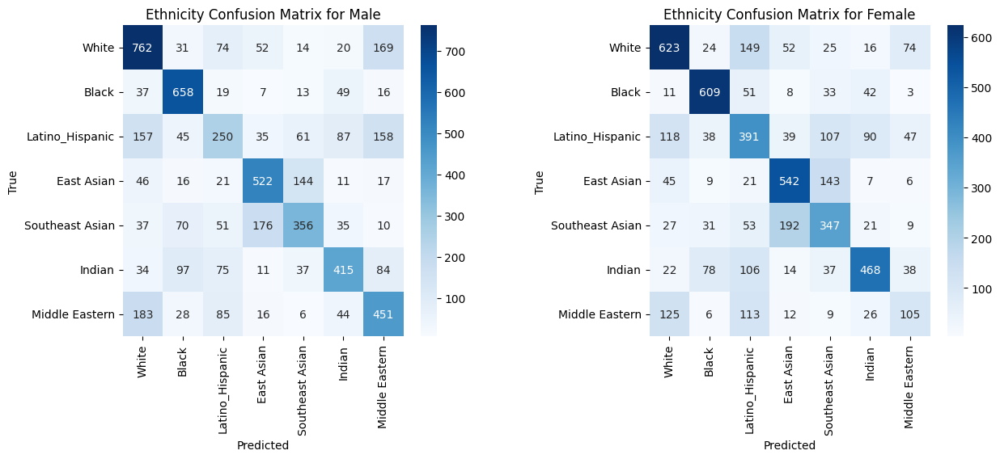

In [ ]:
# plot ethnicity confusion matrices for the two genders side by side
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
plot_confusion_matrix(y_true_ethnicity_male, y_pred_ethnicity_male, ethnicity_labels, "Ethnicity Confusion Matrix for Male", ax=axes[0])
plot_confusion_matrix(y_true_ethnicity_female, y_pred_ethnicity_female, ethnicity_labels, "Ethnicity Confusion Matrix for Female", ax=axes[1])
plt.subplots_adjust(wspace=0.5)
plt.show()

In [ ]:
# make a dataframe storing the performance of gender detection for each ethnicity and age group
from sklearn.metrics import classification_report

# get the labels
age_labels = list(age_mapping.keys())
gender_labels = list(gender_mapping.keys())
ethnicity_labels = list(ethnicity_mapping.keys())

age_classification_report = classification_report(y_true_age, y_pred_age, target_names=age_labels)
gender_classification_report = classification_report(y_true_gender, y_pred_gender, target_names=gender_labels)
ethnicity_classification_report = classification_report(y_true_ethnicity, y_pred_ethnicity, target_names=ethnicity_labels)

print("Age Classification Report:\n", age_classification_report)
print("Gender Classification Report:\n", gender_classification_report)
print("Ethnicity Classification Report:\n", ethnicity_classification_report)


Age Classification Report:
               precision    recall  f1-score   support

         0-2       0.76      0.51      0.61       199
         3-9       0.69      0.76      0.73      1356
       10-19       0.44      0.26      0.32      1181
       20-29       0.54      0.72      0.62      3300
       30-39       0.43      0.35      0.38      2330
       40-49       0.39      0.37      0.38      1353
       50-59       0.44      0.37      0.40       796
       60-69       0.41      0.33      0.36       321
         70+       0.41      0.34      0.37       118

    accuracy                           0.51     10954
   macro avg       0.50      0.44      0.46     10954
weighted avg       0.50      0.51      0.49     10954

Gender Classification Report:
               precision    recall  f1-score   support

        Male       0.88      0.89      0.88      5792
      Female       0.87      0.86      0.86      5162

    accuracy                           0.87     10954
   macro avg      

In [ ]:
gender_accuracy = {}
for age in age_labels:
    age_indices = np.where(y_true_age == age_mapping[age])
    gender_accuracy[age] = np.mean(y_true_gender[age_indices] == y_pred_gender[age_indices])
    print(f"Gender Prediction accuracy for {age}: {gender_accuracy[age]}")

Gender Prediction accuracy for 0-2: 0.6984924623115578
Gender Prediction accuracy for 3-9: 0.7485250737463127
Gender Prediction accuracy for 10-19: 0.7891617273497037
Gender Prediction accuracy for 20-29: 0.9163636363636364
Gender Prediction accuracy for 30-39: 0.917167381974249
Gender Prediction accuracy for 40-49: 0.9164818920916482
Gender Prediction accuracy for 50-59: 0.8944723618090452
Gender Prediction accuracy for 60-69: 0.8504672897196262
Gender Prediction accuracy for 70+: 0.8135593220338984


In [ ]:
gender_accuracy = {}
for ethnicity in ethnicity_labels:
    ethnicity_indices = np.where(y_true_ethnicity == ethnicity_mapping[ethnicity])
    gender_accuracy[ethnicity] = np.mean(y_true_gender[ethnicity_indices] == y_pred_gender[ethnicity_indices])
    print(f"Gender Prediction accuracy for {ethnicity}: {gender_accuracy[ethnicity]}")

Gender Prediction accuracy for White: 0.8796163069544365
Gender Prediction accuracy for Black: 0.7962724935732648
Gender Prediction accuracy for Latino_Hispanic: 0.9026494146642021
Gender Prediction accuracy for East Asian: 0.8806451612903226
Gender Prediction accuracy for Southeast Asian: 0.8643109540636043
Gender Prediction accuracy for Indian: 0.8779683377308707
Gender Prediction accuracy for Middle Eastern: 0.9189412737799835


In [ ]:
age_accuracy = {}
for gender in gender_labels:
    gender_indices = np.where(y_true_gender == gender_mapping[gender])
    age_accuracy[gender] = np.mean(y_true_age[gender_indices] == y_pred_age[gender_indices])
    print(f"Age Prediction accuracy for {gender}: {age_accuracy[gender]}")

Age Prediction accuracy for Male: 0.5119129834254144
Age Prediction accuracy for Female: 0.5042619139868268


In [ ]:
age_accuracy = {}
for ethnicity in ethnicity_labels:
    ethnicity_indices = np.where(y_true_ethnicity == ethnicity_mapping[ethnicity])
    age_accuracy[ethnicity] = np.mean(y_true_age[ethnicity_indices] == y_pred_age[ethnicity_indices])
    print(f"Age Prediction accuracy for {ethnicity}: {age_accuracy[ethnicity]}")

Age Prediction accuracy for White: 0.49160671462829736
Age Prediction accuracy for Black: 0.44151670951156813
Age Prediction accuracy for Latino_Hispanic: 0.5015403573629081
Age Prediction accuracy for East Asian: 0.5864516129032258
Age Prediction accuracy for Southeast Asian: 0.5201413427561837
Age Prediction accuracy for Indian: 0.4967018469656992
Age Prediction accuracy for Middle Eastern: 0.532671629445823


In [ ]:
ethnicity_accuracy = {}
for age in age_labels:
    age_indices = np.where(y_true_age == age_mapping[age])
    ethnicity_accuracy[age] = np.mean(y_true_ethnicity[age_indices] == y_pred_ethnicity[age_indices])
    print(f"Ethnicity Prediction accuracy for {age}: {ethnicity_accuracy[age]}")

Ethnicity Prediction accuracy for 0-2: 0.5879396984924623
Ethnicity Prediction accuracy for 3-9: 0.6194690265486725
Ethnicity Prediction accuracy for 10-19: 0.6316680779000847
Ethnicity Prediction accuracy for 20-29: 0.5954545454545455
Ethnicity Prediction accuracy for 30-39: 0.5888412017167381
Ethnicity Prediction accuracy for 40-49: 0.5750184774575019
Ethnicity Prediction accuracy for 50-59: 0.5364321608040201
Ethnicity Prediction accuracy for 60-69: 0.5763239875389408
Ethnicity Prediction accuracy for 70+: 0.5847457627118644


In [ ]:
ethnicity_accuracy = {}
for gender in gender_labels:
    gender_indices = np.where(y_true_gender == gender_mapping[gender])
    ethnicity_accuracy[gender] = np.mean(y_true_ethnicity[gender_indices] == y_pred_ethnicity[gender_indices])
    print(f"Ethnicity Prediction accuracy for {gender}: {ethnicity_accuracy[gender]}")

Ethnicity Prediction accuracy for Male: 0.5894337016574586
Ethnicity Prediction accuracy for Female: 0.5976365749709415


In [ ]:
# get gender accuracy for each (age group, ethnicity group) combination
gender_accuracy = {}
for age in age_labels:
    for ethnicity in ethnicity_labels:
        age_indices = np.where(y_true_age == age_mapping[age])
        ethnicity_indices = np.where(y_true_ethnicity == ethnicity_mapping[ethnicity])
        common_indices = np.intersect1d(age_indices, ethnicity_indices)
        if len(common_indices) > 0:
            gender_accuracy[(age, ethnicity)] = np.mean(y_true_gender[common_indices] == y_pred_gender[common_indices])

# print the gender accuracy for each (age group, ethnicity group) combination
for (age, ethnicity), accuracy in gender_accuracy.items():
    print(f"Gender accuracy for {age} and {ethnicity}: {accuracy}")


Gender accuracy for 0-2 and White: 0.6590909090909091
Gender accuracy for 0-2 and Black: 0.68
Gender accuracy for 0-2 and Latino_Hispanic: 0.8421052631578947
Gender accuracy for 0-2 and East Asian: 0.7551020408163265
Gender accuracy for 0-2 and Southeast Asian: 0.5588235294117647
Gender accuracy for 0-2 and Indian: 0.6111111111111112
Gender accuracy for 0-2 and Middle Eastern: 1.0
Gender accuracy for 3-9 and White: 0.7346938775510204
Gender accuracy for 3-9 and Black: 0.6875
Gender accuracy for 3-9 and Latino_Hispanic: 0.6966292134831461
Gender accuracy for 3-9 and East Asian: 0.8318181818181818
Gender accuracy for 3-9 and Southeast Asian: 0.8357487922705314
Gender accuracy for 3-9 and Indian: 0.7158469945355191
Gender accuracy for 3-9 and Middle Eastern: 0.7241379310344828
Gender accuracy for 10-19 and White: 0.7425149700598802
Gender accuracy for 10-19 and Black: 0.6847290640394089
Gender accuracy for 10-19 and Latino_Hispanic: 0.8697674418604651
Gender accuracy for 10-19 and East As

In [ ]:
age_accuracy = {}
for gender in gender_labels:
    for ethnicity in ethnicity_labels:
        gender_indices = np.where(y_true_gender == gender_mapping[gender])
        ethnicity_indices = np.where(y_true_ethnicity == ethnicity_mapping[ethnicity])
        common_indices = np.intersect1d(gender_indices, ethnicity_indices)
        if len(common_indices) > 0:
            age_accuracy[(gender, ethnicity)] = np.mean(y_true_age[common_indices] == y_pred_age[common_indices])
            print(f"Age accuracy for {gender} and {ethnicity}: {age_accuracy[(gender, ethnicity)]:.4f}")

Age accuracy for Male and White: 0.4795
Age accuracy for Male and Black: 0.4543
Age accuracy for Male and Latino_Hispanic: 0.5095
Age accuracy for Male and East Asian: 0.5804
Age accuracy for Male and Southeast Asian: 0.5361
Age accuracy for Male and Indian: 0.5153
Age accuracy for Male and Middle Eastern: 0.5252
Age accuracy for Female and White: 0.5057
Age accuracy for Female and Black: 0.4280
Age accuracy for Female and Latino_Hispanic: 0.4940
Age accuracy for Female and East Asian: 0.5925
Age accuracy for Female and Southeast Asian: 0.5029
Age accuracy for Female and Indian: 0.4784
Age accuracy for Female and Middle Eastern: 0.5480


In [ ]:
ethnicity_accuracy = {}
for gender in gender_labels:
    for age in age_labels:
        gender_indices = np.where(y_true_gender == gender_mapping[gender])
        age_indices = np.where(y_true_age == age_mapping[age])
        common_indices = np.intersect1d(gender_indices, age_indices)
        if len(common_indices) > 0:
            ethnicity_accuracy[(gender, age)] = np.mean(y_true_ethnicity[common_indices] == y_pred_ethnicity[common_indices])
            print(f"Ethnicity accuracy for {gender} and {age}: {ethnicity_accuracy[(gender, age)]:.4f}")

Ethnicity accuracy for Male and 0-2: 0.6098
Ethnicity accuracy for Male and 3-9: 0.6491
Ethnicity accuracy for Male and 10-19: 0.6175
Ethnicity accuracy for Male and 20-29: 0.5960
Ethnicity accuracy for Male and 30-39: 0.5846
Ethnicity accuracy for Male and 40-49: 0.5742
Ethnicity accuracy for Male and 50-59: 0.5000
Ethnicity accuracy for Male and 60-69: 0.5556
Ethnicity accuracy for Male and 70+: 0.5667
Ethnicity accuracy for Female and 0-2: 0.5526
Ethnicity accuracy for Female and 3-9: 0.5837
Ethnicity accuracy for Female and 10-19: 0.6440
Ethnicity accuracy for Female and 20-29: 0.5950
Ethnicity accuracy for Female and 30-39: 0.5943
Ethnicity accuracy for Female and 40-49: 0.5764
Ethnicity accuracy for Female and 50-59: 0.5967
Ethnicity accuracy for Female and 60-69: 0.6140
Ethnicity accuracy for Female and 70+: 0.6034


## Saving the model

In [ ]:
# Save the model state dictionary
model_path = 'multi_task_model.pth'
torch.save(model.state_dict(), model_path)
print(f"Model saved to {model_path}")

Model saved to multi_task_model.pth


In [ ]:
# load the model
model = LightweightMTLNet224(num_classes_gender=2, num_classes_age=num_age_classes, num_classes_ethnicity=num_ethnicity_classes).to(device)
model.load_state_dict(torch.load('/content/multi_task_model.pth'))

<ipython-input-41-b6273c5c6ecd>:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('/content/multi_task_model.pth'))


<All keys matched successfully>

## visualizing the output for some sample images

In [ ]:
def predict_proba(model, image_path, transform, device):
    """
    Predicts the probability distribution for gender, age, and ethnicity.

    Args:
        model: The trained multi-task model.
        image_path: Path to the input image.
        transform: Image transformations.
        device: Device to run the model on.

    Returns:
        A dictionary containing the image and probability distributions for gender, age, and ethnicity.
    """

    model.eval()
    image = Image.open(image_path).convert("RGB")
    image = transform(image).unsqueeze(0).to(device)

    with torch.no_grad():
        gender_output, age_output, ethnicity_output = model(image)

    # Convert outputs to probability distributions
    gender_proba = torch.softmax(gender_output, dim=1).cpu().numpy()[0]
    age_proba = torch.softmax(age_output, dim=1).cpu().numpy()[0]
    ethnicity_proba = torch.softmax(ethnicity_output, dim=1).cpu().numpy()[0]

    return {
        'image': image_path,
        'gender_proba': gender_proba,
        'age_proba': age_proba,
        'ethnicity_proba': ethnicity_proba
    }

In [ ]:
def plot_results(prediction_result):
    """Plots the image, gender, age, and ethnicity probabilities in a single row."""

    fig, axes = plt.subplots(1, 4, figsize=(20, 5))

    # Plot the image
    image = Image.open(prediction_result['image']).convert("RGB")
    axes[0].imshow(image)
    axes[0].set_title("Image")
    axes[0].axis('off')

    # Plot gender probability
    labels = ['Male', 'Female']
    axes[1].bar(labels, prediction_result['gender_proba'])
    axes[1].set_title('Gender Probability')

    # Plot age probability
    labels = ['0-2', '3-9', '10-19', '20-29', '30-39', '40-49', '50-59', '60-69', 'more than 70']
    axes[2].bar(labels, prediction_result['age_proba'])
    axes[2].tick_params(axis='x', rotation=45) # Rotate x-axis labels for better readability
    axes[2].set_title('Age Probability')

    # Plot ethnicity probability
    labels = ['White', 'Black', 'Latino_Hispanic', 'East Asian', 'Southeast Asian', 'Indian', 'Middle Eastern']
    axes[3].bar(labels, prediction_result['ethnicity_proba'])
    axes[3].tick_params(axis='x', rotation=45)  # Rotate x-axis labels
    axes[3].set_title('Ethnicity Probability')

    plt.tight_layout()  # Adjust layout to prevent overlapping titles
    plt.show()

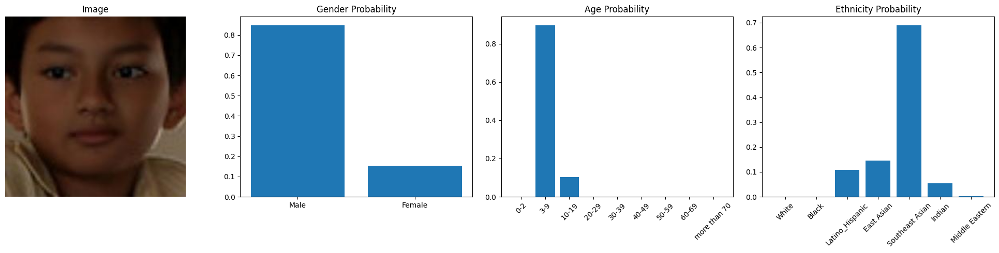

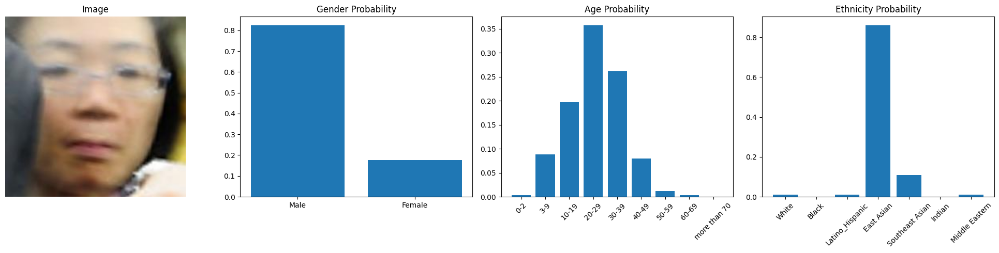

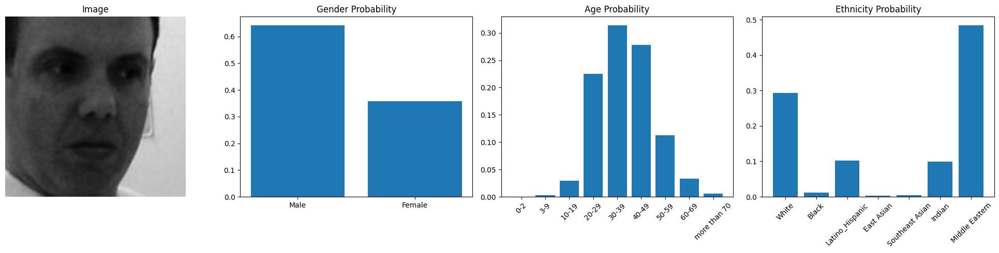

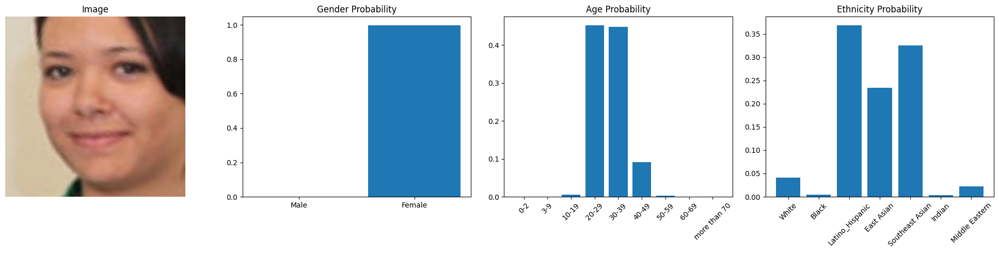

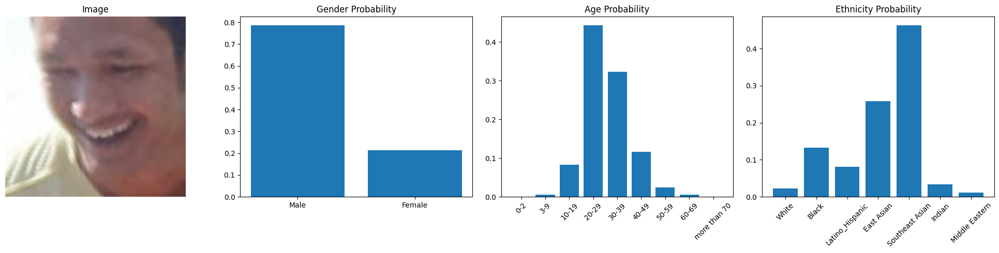

...

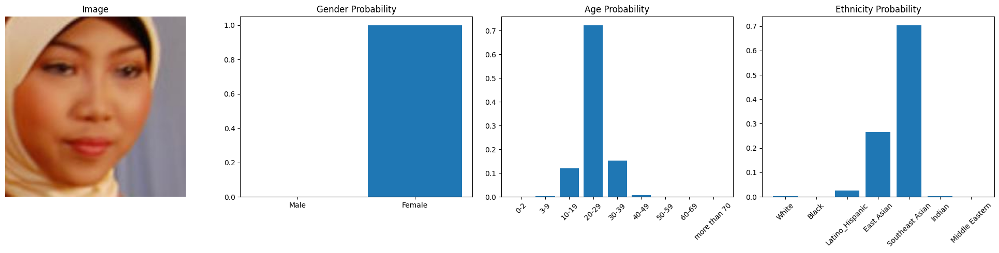

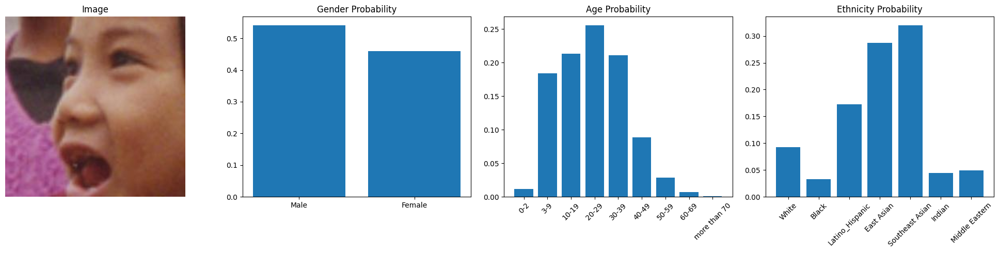

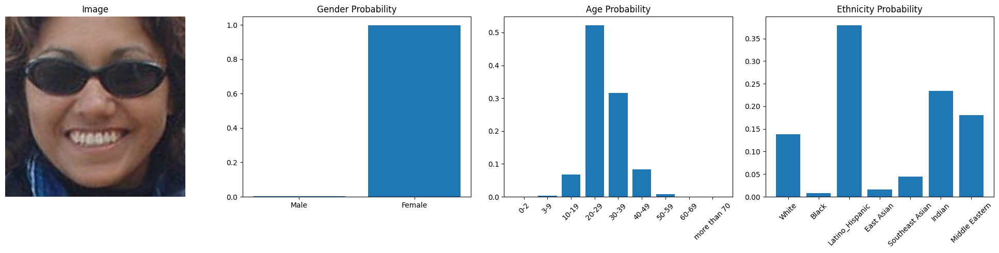

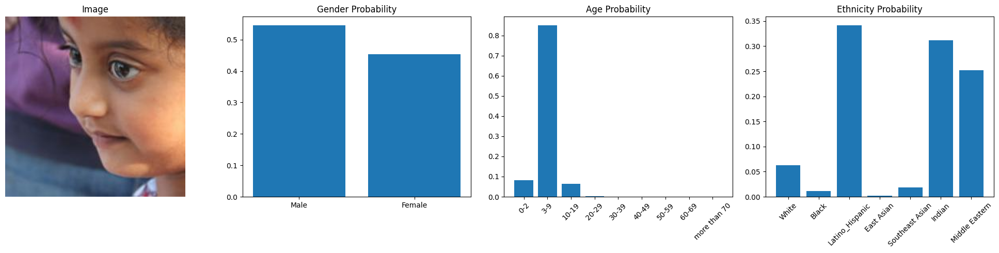

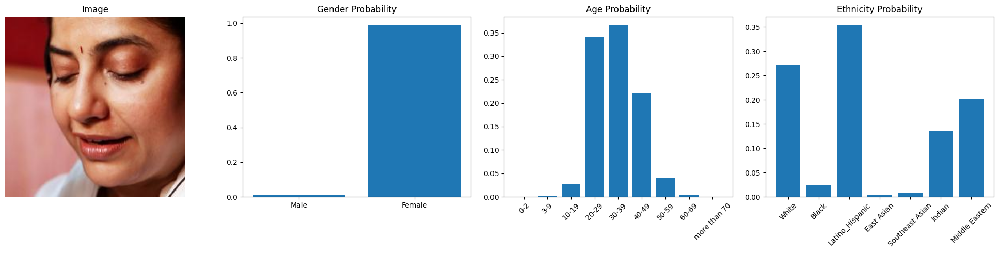

In [ ]:
def show_predictions(model, val_loader, num_images=32):
    model.eval()
    with torch.no_grad():
        for images, (gender_labels, age_labels, ethnicity_labels) in val_loader:
            images = images.to(device)
            gender_output, age_output, ethnicity_output = model(images)

            _, predicted_genders = torch.max(gender_output, 1)
            _, predicted_ages = torch.max(age_output, 1)
            _, predicted_ethnicities = torch.max(ethnicity_output, 1)

            for i in range(min(num_images, len(images))):
                # get the corresponding image from the directory
                img_path = os.path.join('/content/', val_dataset.annotations.iloc[i, 0])
                prediction_result = predict_proba(model, img_path, val_transform, device)
                plot_results(prediction_result)
            break

show_predictions(model, val_loader)